<a href="https://colab.research.google.com/github/HollySenior/GEOG5160/blob/main/GEOG5160_201416775.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Student ID: 201416775

In [1]:
# read in required packages
!pip install mapclassify
!pip install complexity
!pip install geoplot
!pip install git+https://github.com/pmdscully/geo_northarrow.git

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 882.2/882.2 kB 12.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for complexity: filename=complexity-0.9.1-py3-none-any.whl size=13457 sha256=f3d4ecea72388202a594189f2586de9f751126a02cb54d4bd43d330107c8bb8e
  Stored in directory: /root/.cache/pip/wheels/1b/43/22/f6394ce3bea53645f5d20a8000aef8237f97bd0612466673aa
Successfully built complexity
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.7/11.7 MB 69.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 61.9 MB/s eta 0:00:00
  Cloning https://github.com/pmdscully/geo_northarrow.git to /tmp/pip-req-build-nuklxswd
  Running command git clone --filter=blob:none --quiet https://github.com/pmdscully/geo_northarrow.git /tmp/pip-req-build-nuklxswd
  Resolved https://github.com/pmdscully/geo_northarrow.git to commit 963bdd271707a3bcaa47b2d83d92b88ae0b10950
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Prepa

In [2]:
# import relevant packages
import geopandas as gpd
import pandas as pd
import os
import matplotlib
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pyproj
import contextily as ctx
import geoplot as gplt
import geoplot.crs as gcrs
from geo_northarrow import add_north_arrow

In [3]:
!pip install routingpy
from routingpy.routers import ORS

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.4/84.4 kB 2.5 MB/s eta 0:00:00


Collect relevant data: Leeds LSOAs


In [8]:
# code used to connect to google drive to import LSOAs dataset
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# large LSOA (2021) file downloaded from:https://geoportal.statistics.gov.uk/datasets/2bbaef5230694f3abae4f9145a3a9800_0/explore
# saved in MyDrive and read in as a geojson file using geopandas package
##lsoa =gpd.read_file('/content/drive/MyDrive/Lower_layer_Super_Output_Areas_(December_2021).geojson')

In [ ]:
#check upload
#show top 5 rows of dataset
##lsoa.head()

,FID,LSOA21CD,LSOA21NM,LSOA21NMW,BNG_E,BNG_N,LAT,LONG,Shape__Area,Shape__Length,GlobalID,geometry
0,1,E01000001,City of London 001A,,532123,181632,51.51817,-0.097150,129865.314476,2635.767993,c625aea8-6d73-4b2a-be76-4d5c44cad9f8,"POLYGON ((-0.09665 51.52028, -0.09663 51.52025..."
1,2,E01000002,City of London 001B,,532480,181715,51.51883,-0.091970,228419.782242,2707.816821,52c878e9-ac68-4886-b4a8-fea9cd241a70,"POLYGON ((-0.08967 51.52069, -0.08971 51.52058..."
2,3,E01000003,City of London 001C,,532239,182033,51.52174,-0.095330,59054.204697,1224.573160,b9d8faca-d489-478d-8ce6-acaf76186d7d,"POLYGON ((-0.0965 51.52295, -0.09644 51.52282,..."
3,4,E01000005,City of London 001E,,533581,181283,51.51469,-0.076280,189577.709503,2275.805344,15e1417d-537c-4845-9820-fc7596bd59b0,"POLYGON ((-0.07568 51.51575, -0.07539 51.51555..."
4,5,E01000006,Barking and Dagenham 016A,,544994,184274,51.53875,0.089317,146536.995750,1966.092607,8a6c4ee0-c0ff-4736-9cfa-fb12a6d50da0,"POLYGON ((0.09125 51.53905, 0.0915 51.5389, 0...."


In [ ]:
# code used to get LSOAs where name contains Leeds
##leeds_lsoa = lsoa.loc[lsoa['LSOA21NM'].str.contains('Leeds'),:]
# save LeedsLSOA as a .geojson
##leeds_lsoa.to_file('/content/drive/MyDrive/LeedsLSOAs.geojson')


# read in LeedsLSOA geoJson from Google Drive
##leeds_lsoa =gpd.read_file('/content/drive/MyDrive/LeedsLSOAs.geojson')

In [ ]:
# check uploaded dataset is correct
# show top 5 rows of dataset
##leeds_lsoa.head()

,FID,LSOA21CD,LSOA21NM,LSOA21NMW,BNG_E,BNG_N,LAT,LONG,Shape__Area,Shape__Length,GlobalID,geometry
0,10720,E01011264,Leeds 011A,,420937,441836,53.87233,-1.68306,6.373247e+05,5076.727907,e4ed2f01-7253-4c5a-ba48-c2778526dc67,"POLYGON ((-1.67829 53.87663, -1.67775 53.87654..."
1,10721,E01011265,Leeds 009A,,418988,441951,53.87343,-1.71270,5.273672e+05,7553.237963,4d252abf-180d-4c24-ae8f-3932dd433d0f,"POLYGON ((-1.71803 53.87891, -1.71799 53.87886..."
2,10722,E01011266,Leeds 008A,,417489,442615,53.87945,-1.73546,2.531467e+06,8353.989324,66191f73-111e-4f37-ba33-42666730927f,"POLYGON ((-1.73093 53.88634, -1.73085 53.88633..."
3,10723,E01011267,Leeds 009B,,419641,442025,53.87408,-1.70276,4.491912e+05,3774.393194,85e5e657-9d57-4a48-aa5f-61fdc02cd326,"POLYGON ((-1.70324 53.87734, -1.70317 53.87675..."
4,10724,E01011268,Leeds 010A,,420224,441935,53.87324,-1.69390,3.949483e+05,4362.834372,58280f14-db59-4eee-875a-44d3c04026d8,"POLYGON ((-1.69055 53.87774, -1.69053 53.87759..."


In [4]:
# Leeds LSOA file moved to github repo
#read in Leeds LSOAs datset from GitHub repo as a geojson file using geopandas package
leeds_lsoas = gpd.read_file('https://github.com/HollySenior/GEOG5160/raw/refs/heads/main/LeedsLSOAs.geojson')

In [ ]:
# checking upload has worked
# explore interactive leaflet map
leeds_lsoas.explore()

Collect relevant data: Leeds Output Areas

In [ ]:
# large OA (2021) file downloaded from:https://geoportal.statistics.gov.uk/datasets/2bbaef5230694f3abae4f9145a3a9800_0/explore
# saved in MyDrive and read in as a geopackage file using geopandas package
#oa =gpd.read_file('/content/drive/MyDrive/Output_Areas_2021_EW_BFC_V8_-393965239550753877.gpkg')

In [ ]:
# check upload
#oa.head()

In [9]:
# code used to get OAs where name contains Leeds
#leeds_oa = oa.loc[oa['LSOA21NM'].str.contains('Leeds'),:]
# save LeedsOA as a .geojson
#leeds_oa.to_file('/content/drive/MyDrive/LeedsOAs.geojson')


# read in LeedsLSOA geoJson from Google Drive
leeds_oa =gpd.read_file('/content/drive/MyDrive/LeedsOAs.geojson')

In [ ]:
# check uploaded dataset is correct
# show top 5 rows of dataset
#leeds_oa.head()

In [10]:
# check size of dataset
leeds_oa.shape

(2607, 10)

In [ ]:
#leeds_oa.explore()

Collect relevant data: upload Leeds OA population weighted centroids

In [ ]:
# large OA population weighted centroids (2021) file downloaded from:https://geoportal.statistics.gov.uk/datasets/2bbaef5230694f3abae4f9145a3a9800_0/explore
# saved in MyDrive and read in as a geopackage file using geopandas package
##oa_pwc =gpd.read_file('/content/drive/MyDrive/Output_Areas_2021_PWC_V3_5187587502528298152.gpkg')

In [ ]:
##oa_pwc.head()

In [ ]:
# leeds output area population weighted centroids
##leeds_oa_pwc = pd.merge(leeds_oa, oa_pwc, left_on='OA21CD', right_on='OA21CD', how ='left')

In [ ]:
##leeds_oa_pwc.shape

In [ ]:
##leeds_oa_pwc = leeds_oa_pwc.rename (columns = {'geometry_y':'geometry'})

In [ ]:
##leeds_oa_pwc.head()

In [ ]:
##leeds_oa_pwc.shape

In [ ]:
##leeds_oa_pwc.crs

In [ ]:
##leeds_oa_pwc = leeds_oa_pwc.drop('geometry_x', axis=1)

In [5]:
# save to drive and move to github
###leeds_oa_pwc.to_file('/content/drive/MyDrive/Leeds_OA_PWC.geojson')
#upload via GitHub
leeds_oa_pwc = gpd.read_file('https://github.com/HollySenior/GEOG5160/raw/refs/heads/main/Leeds_OA_PWC.geojson')

In [6]:
# convert crs of leeds_oa_pwc layer to WGS84 for network analysis
leeds_oa_pwc_wgs84 = leeds_oa_pwc.to_crs(epsg=4326)

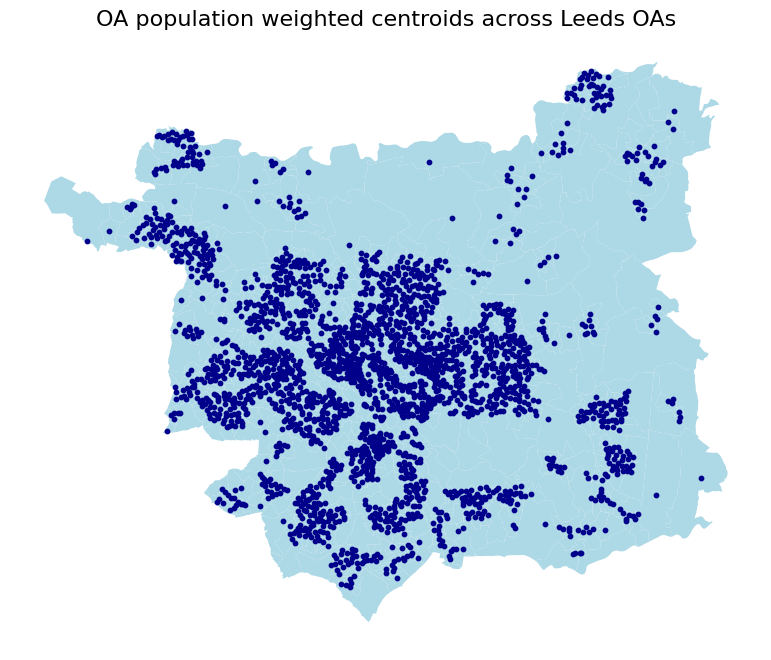

In [11]:
# create figure with 1 subplot
f, ax = plt.subplots (1, figsize = (16,8))

# plot community growing schemes aross Leeds LSOAs
leeds_oa.plot(ax=ax,color = "lightblue")
leeds_oa_pwc.plot(ax=ax, color = "darkblue", markersize =10)
# set title and adjust font size
ax.set_title('OA population weighted centroids across Leeds OAs', fontsize = 16)
# remove axis
ax.set_axis_off()
# add north arrow and arrange placement
#add_north_arrow(ax=ax, scale=.75, xlim_pos=0.1, ylim_pos=.85, color='#000', text_scaler=2, text_yT=-1.25)

plt.show();

Collect relevant data: Community growing schemes

In [12]:
# read in CGS data from github
# Ordnance Survey, Feed Leeds and Good to Grow data merged in ArcGIS Pro
cgs = gpd.read_file("https://github.com/HollySenior/GEOG5160/raw/refs/heads/main/CGStotal.shp")

In [13]:
cgs.head()

,Scheme,latitude,longitude,descriptio,source,id,accessType,refToGSite,geometry
0,Horsforth community garden,53.838501,-1.648322,None,Good to Grow (https://www.goodtogrowuk.org/map...,None,None,None,POINT Z (-1.64832 53.8385 0)
1,Crossgates train station,53.804548,-1.451203,None,Good to Grow (https://www.goodtogrowuk.org/map...,None,None,None,POINT Z (-1.4512 53.80455 0)
2,Gipton Growers community garden,53.802747,-1.493973,Run by Space2,Good to Grow (https://www.goodtogrowuk.org/map...,None,None,None,POINT Z (-1.49397 53.80275 0)
3,Incredible Edible Rothwell,53.755812,-1.480561,None,Feed Leeds (https://feedleeds.org/maps/),None,None,None,POINT Z (-1.48056 53.75581 0)
4,Incredible Edible Aireborough,53.879758,-1.715107,Parkinsons Park Herb Bed (The Friends of Parki...,Feed Leeds (https://feedleeds.org/maps/),None,None,None,POINT Z (-1.71511 53.87976 0)


In [14]:
# check crs is WGS84 for network analysis
cgs.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [15]:
#edit CRS for visualisation
cgs_27700 = cgs.to_crs(epsg=27700)

In [45]:
cgs_27700.shape

(309, 9)

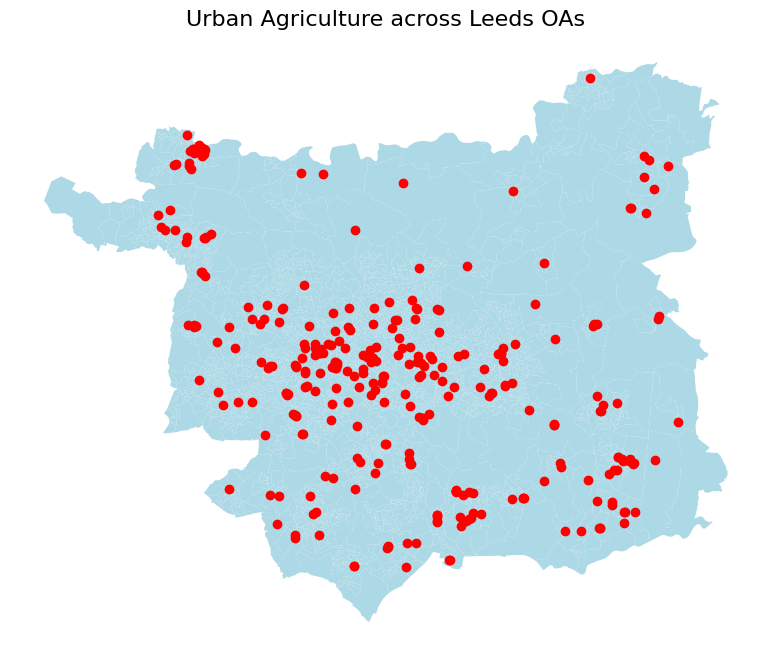

In [16]:
# create figure with 1 subplot
f, ax = plt.subplots (1, figsize = (16,8))

# plot community growing schemes aross Leeds LSOAs
leeds_oa.plot(ax=ax,color = "lightblue")
cgs_27700.plot(ax=ax, color = "red")
# set title and adjust font size
ax.set_title('Urban Agriculture across Leeds OAs', fontsize = 16)
# remove axis
ax.set_axis_off()
# add north arrow and arrange placement
#add_north_arrow(ax=ax, scale=.75, xlim_pos=0.1, ylim_pos=.85, color='#000', text_scaler=2, text_yT=-1.25)

plt.show();

Collect relevant data: PPFI

In [17]:
# read in 'PPFI' dataset from gitHub repo as a csv file using panda package
# dataset sourced from CRDC website: https://www.cdrc.ac.uk/updated-priority-places-for-food-index/
## Data provided by the Consumer Data Research Centre, an ESRC Data Investment...
ppfi = pd.read_csv("https://github.com/HollySenior/GEOG5160/raw/refs/heads/main/ppfi_v2.1.csv")

In [18]:
# check upload
# show top 5 rows of dataset to understand rows and columns
ppfi.head()

,lsoa21cd,domain_supermarket_proximity,domain_supermarket_accessibility,domain_ecommerce_access,domain_socio_demographic,domain_nonsupermarket_proximity,domain_food_for_families,domain_fuel_poverty,country,country_denominator,combined,pp_dec_domain_supermarket_proximity,pp_dec_domain_supermarket_accessibility,pp_dec_domain_ecommerce_access,pp_dec_domain_socio_demographic,pp_dec_domain_nonsupermarket_proximity,pp_dec_domain_food_for_families,pp_dec_domain_fuel_poverty,pp_dec_combined
0,95AA01S1,480,NaN,NaN,810,518,760,NaN,NI,890,810,6,NaN,NaN,10,6,9,NaN,10
1,95AA01S2,446,NaN,NaN,789,511,793,NaN,NI,890,807,6,NaN,NaN,9,6,9,NaN,10
2,95AA01S3,435,NaN,NaN,688,291,686,NaN,NI,890,549,5,NaN,NaN,8,4,8,NaN,7
3,95AA02W1,714,NaN,NaN,470,661,237,NaN,NI,890,454,9,NaN,NaN,6,8,3,NaN,6
4,95AA03W1,344,NaN,NaN,218,467,614,NaN,NI,890,242,4,NaN,NaN,3,6,7,NaN,3


Pre-processing: Join PPFI with Leeds LSOAs

In [19]:
# join ppfi (non spatial) dataset with Leeds LSOAs (spatial) dataset using pandas package
leeds_ppfi = pd.merge(leeds_lsoas, ppfi, left_on='LSOA21CD', right_on='lsoa21cd', how ='left')

In [20]:
#check join
#show top 5 rows of dataset
leeds_ppfi.head()

,FID,LSOA21CD,LSOA21NM,LSOA21NMW,BNG_E,BNG_N,LAT,LONG,Shape__Area,Shape__Length,...,country_denominator,combined,pp_dec_domain_supermarket_proximity,pp_dec_domain_supermarket_accessibility,pp_dec_domain_ecommerce_access,pp_dec_domain_socio_demographic,pp_dec_domain_nonsupermarket_proximity,pp_dec_domain_food_for_families,pp_dec_domain_fuel_poverty,pp_dec_combined
0,10720,E01011264,Leeds 011A,,420937,441836,53.87233,-1.68306,6.373247e+05,5076.727907,...,33755,6959,7,3.0,5.0,6,5,3,6.0,3
1,10721,E01011265,Leeds 009A,,418988,441951,53.87343,-1.71270,5.273672e+05,7553.237963,...,33755,16481,9,6.0,6.0,5,5,3,8.0,5
2,10722,E01011266,Leeds 008A,,417489,442615,53.87945,-1.73546,2.531467e+06,8353.989324,...,33755,31982,6,2.0,9.0,10,4,4,10.0,10
3,10723,E01011267,Leeds 009B,,419641,442025,53.87408,-1.70276,4.491912e+05,3774.393194,...,33755,4233,7,4.0,3.0,4,5,3,5.0,2
4,10724,E01011268,Leeds 010A,,420224,441935,53.87324,-1.69390,3.949483e+05,4362.834372,...,33755,1561,6,2.0,3.0,3,5,3,4.0,1


In [ ]:
Data cleaning: check for unwanted outliers in PPFI dataset.

<Axes: xlabel='combined'>

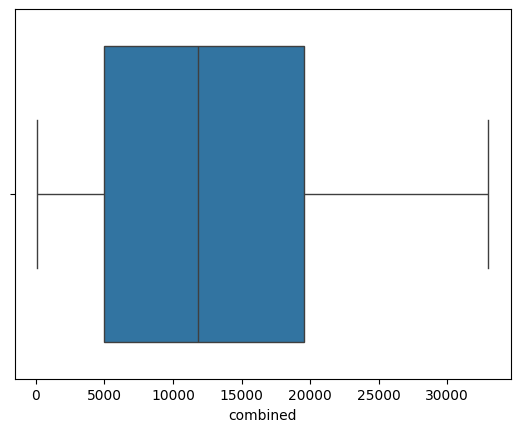

In [21]:

# visualise summary statistics and check for outliers with box plot of ppfi data
sns.boxplot(x=leeds_ppfi["combined"])

In [22]:
# explore summary statistics of ppfi scores in Leeds LSOAs
# what is the mean?
# are there any extreme values/ outliers?
leeds_ppfi['combined'].describe()

,combined
count,488.000000
mean,12521.000000
std,8531.061802
min,110.000000
25%,4970.250000
50%,11823.000000
75%,19589.000000
max,33001.000000


In [ ]:
Check for null data

In [23]:
leeds_ppfi.isna().any()

,0
FID,False
LSOA21CD,False
LSOA21NM,False
LSOA21NMW,False
BNG_E,False
BNG_N,False
LAT,False
LONG,False
Shape__Area,False
Shape__Length,False


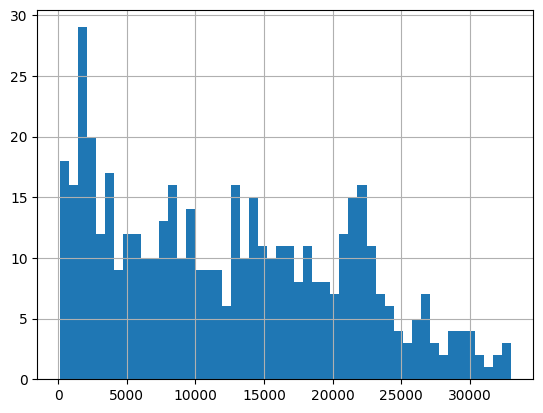

In [24]:
# explore distribution of ppfi scores in Leeds via histogram (coninuous numercial data)
# adjust bins for more detail
leeds_ppfi['combined'].hist(bins=50);

In [25]:
# explore data types and check they are as expected
leeds_ppfi.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 488 entries, 0 to 487
Data columns (total 31 columns):
 #   Column                                   Non-Null Count  Dtype   
---  ------                                   --------------  -----   
 0   FID                                      488 non-null    int32   
 1   LSOA21CD                                 488 non-null    object  
 2   LSOA21NM                                 488 non-null    object  
 3   LSOA21NMW                                488 non-null    object  
 4   BNG_E                                    488 non-null    int32   
 5   BNG_N                                    488 non-null    int32   
 6   LAT                                      488 non-null    float64 
 7   LONG                                     488 non-null    float64 
 8   Shape__Area                              488 non-null    float64 
 9   Shape__Length                            488 non-null    float64 
 10  GlobalID                      

In [26]:
#check CRS
leeds_ppfi.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [27]:
#edit CRS for visualisation
leeds_ppfi_27700 = leeds_ppfi.to_crs(epsg=27700)

Data visualisation

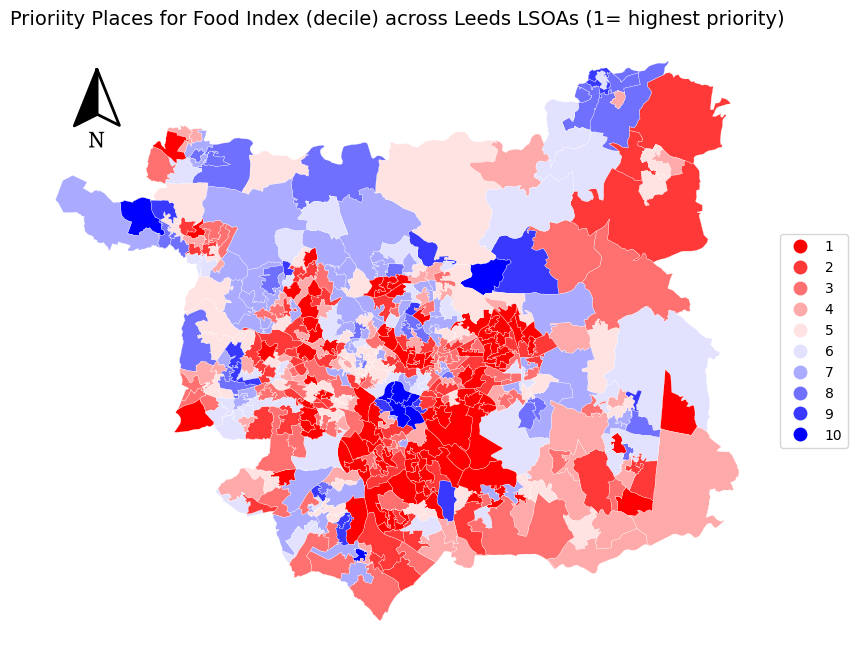

<Figure size 640x480 with 0 Axes>

In [28]:
# create figure with 1 subplot
f, ax = plt.subplots (1, figsize = (16,8))

# choropleth map of PPFI across Leeds LSOAs
leeds_ppfi_27700.plot (ax=ax, column = 'pp_dec_combined', legend = True, cmap = 'bwr_r', categorical = True, k=10, legend_kwds={"loc": "center left", "bbox_to_anchor": (1, 0.5)}, linewidth = 0.2, edgecolor='white')
# set title and adjust font size
ax.set_title('Prioriity Places for Food Index (decile) across Leeds LSOAs (1= highest priority)', fontsize = 14)
# remove axis
ax.set_axis_off()
# add north arrow and arrange placement
add_north_arrow(ax=ax, scale=.75, xlim_pos=0.1, ylim_pos=.85, color='#000', text_scaler=2, text_yT=-1.25)

plt.show();
plt.savefig("PPFI_map.png")


Data analysis: network analysis using routingpy and ORS

In [29]:
ors_api_key = 'eyJvcmciOiI1YjNjZTM1OTc4NTExMTAwMDFjZjYyNDgiLCJpZCI6IjdlNGVhMDgwYjI2ZTQ3NGQ5MWRhODM3NjAzNWJmOTEwIiwiaCI6Im11cm11cjY0In0='
client =ORS(api_key = ors_api_key)

In [30]:
cgs = np.array(list(zip(cgs.to_crs(epsg=4326).geometry.x,
                  cgs.to_crs(epsg=4326).geometry.y))).tolist()

In [31]:
leeds_oa_pwc_wgs84 = np.array(list(zip(leeds_oa_pwc_wgs84.to_crs(epsg=4326).geometry.x,
                  leeds_oa_pwc_wgs84.to_crs(epsg=4326).geometry.y))).tolist()

In [32]:
# create travel time matrix of origins (OA population weighted centroids) and destinations (community growing schemes)

ors_routing_matrix_oa_cgs = client.matrix(
    locations = leeds_oa_pwc_wgs84 + cgs,
    profile = 'foot-walking',
    sources = list(range(len(leeds_oa_pwc_wgs84))),
    destinations = list(range(len(leeds_oa_pwc_wgs84), len(leeds_oa_pwc_wgs84)+len(cgs)))
)

# create new df
cost_matrix_oa_cgs = np.array(ors_routing_matrix_oa_cgs.durations).T

RouterApiError: 400 ({"error":{"code":6004,"message":"Request parameters exceed the server configuration limits. Only a total of 3500 routes are allowed."},"info":{"engine":{"build_date":"2025-06-06T15:39:25Z","graph_version":"2","graph_date":"2025-06-24T15:58:53Z","osm_date":"1970-01-01T00:00:00Z","version":"9.3.0"},"timestamp":1752571842628}})

Collect relevant data: Upload all GS across Leeds from OS

In [33]:
# read in OS greenspaces access points data for Leeds from github
os_greenspace_pts_leeds = gpd.read_file("https://github.com/HollySenior/GEOG5160/raw/refs/heads/main/gs_points_leeds.shp")

In [34]:
os_greenspace_pts_leeds.crs

<Projected CRS: EPSG:27700>
Name: OSGB36 / British National Grid
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: United Kingdom (UK) - offshore to boundary of UKCS within 49°45'N to 61°N and 9°W to 2°E; onshore Great Britain (England, Wales and Scotland). Isle of Man onshore.
- bounds: (-9.01, 49.75, 2.01, 61.01)
Coordinate Operation:
- name: British National Grid
- method: Transverse Mercator
Datum: Ordnance Survey of Great Britain 1936
- Ellipsoid: Airy 1830
- Prime Meridian: Greenwich

In [35]:
os_greenspace_pts_leeds.head()

,id,accessType,refToGSite,geometry
0,6F9AF19B-57A6-46E2-8445-C8A88DD94B8E,Pedestrian,2BE88DDA-3D8E-7FED-E063-AAEFA00A0EDD,POINT Z (420095.86 445908.48 0)
1,68187976-32E8-401C-B404-A4E39D511FA7,Pedestrian,2BE88DDA-3D8E-7FED-E063-AAEFA00A0EDD,POINT Z (420208.64 446022.79 0)
2,384092C0-8722-4A5E-A558-7D984C1F6B94,Pedestrian,2BE88DDA-3D8E-7FED-E063-AAEFA00A0EDD,POINT Z (420182.15 446031.64 0)
3,D4426D0C-9023-41B0-8243-034EE51FC400,Pedestrian,2BE88DDA-3D8E-7FED-E063-AAEFA00A0EDD,POINT Z (420179.52 446032.35 0)
4,43F03326-983E-470F-A860-0CE52FC27F05,Pedestrian,2BE88E2C-99CE-7FED-E063-AAEFA00A0EDD,POINT Z (420245.47 446073.05 0)


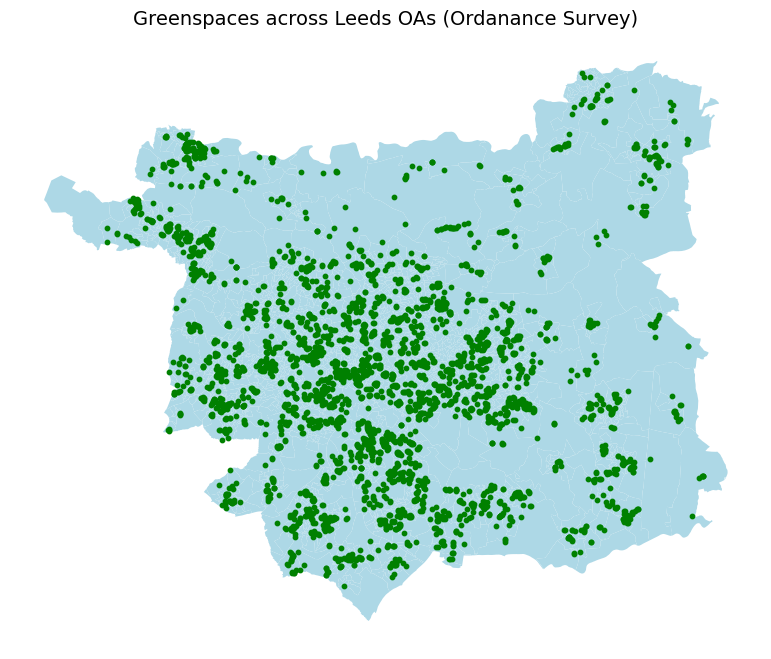

In [36]:
# create figure with 1 subplot
f, ax = plt.subplots (1, figsize = (16,8))

# plot community growing schemes aross Leeds LSOAs
leeds_oa.plot(ax=ax,color = "lightblue")
os_greenspace_pts_leeds.plot(ax=ax, color = "green",markersize =10)
# set title and adjust font size
ax.set_title('Greenspaces across Leeds OAs (Ordanance Survey)', fontsize = 14)
# remove axis
ax.set_axis_off()
# add north arrow and arrange placement
#add_north_arrow(ax=ax, scale=.75, xlim_pos=0.1, ylim_pos=.85, color='#000', text_scaler=2, text_yT=-1.25)

plt.show();

Collect relevant data: Brownfield sites across Leeds

In [37]:
# read in LCC Brownfield site dataset from gitHub repo as a csv file using panda package
# dataset sourced from Data Mill North website: https://datamillnorth.org/dataset/brownfield-land-register-2kqnr
bfs = pd.read_csv("https://github.com/HollySenior/GEOG5160/raw/refs/heads/main/LCC_BrownfieldRegister_22.csv")


In [38]:
bfs.head()

,OrganisationURI,OrganisationLabel,SiteReference,PreviouslyPartOf,SiteNameAddress,SiteplanURL,CoordinateReferenceSystem,GeoX,GeoY,Hectares,...,HazardousSubstances,SiteInformation,Notes,FirstAddedDate,DateUpdate,SiteReferenceAlternate,Easting,Northing,Planning_Ref,BoundRef
0,http://opendatacommunities.org/id/metropolitan...,Leeds City Council,SHL00205,NaN,"""City One (Caddick), Manor Road""",https://leedscc.maps.arcgis.com/apps/webappvie...,ETRS89,-1.547506,53.786981,2.93,...,NaN,NaN,NaN,11/07/2016,20/12/2022,445,429809.0,432415.0,NaN,SHL002051
1,http://opendatacommunities.org/id/metropolitan...,Leeds City Council,SHL00206,NaN,"""57 Great George Street LS1""",https://leedscc.maps.arcgis.com/apps/webappvie...,ETRS89,-1.550341,53.800755,0.02,...,NaN,NaN,NaN,11/07/2016,20/12/2022,446,429613.0,433946.0,NaN,SHL002061
2,http://opendatacommunities.org/id/metropolitan...,Leeds City Council,SHL00207,NaN,"""Doncaster Monk Bridge, Whitehall Road""",https://leedscc.maps.arcgis.com/apps/webappvie...,ETRS89,-1.559982,53.793301,3.49,...,NaN,NaN,NaN,11/07/2016,20/12/2022,447,428983.0,433112.0,18/02481/FU,SHL002071
3,http://opendatacommunities.org/id/metropolitan...,Leeds City Council,SHL00210,NaN,"""Globe Road/water Lane LS11""",https://leedscc.maps.arcgis.com/apps/webappvie...,ETRS89,-1.553260,53.791975,1.79,...,NaN,NaN,NaN,11/07/2016,20/12/2022,450,429426.0,432968.0,17/06455/FU,SHL002101
4,http://opendatacommunities.org/id/metropolitan...,Leeds City Council,SHL00279,NaN,"""Kirkstall Forge\r\nAbbey Road\r\nKirkstall\r\...",https://leedscc.maps.arcgis.com/apps/webappvie...,ETRS89,-1.623489,53.825531,17.82,...,NaN,NaN,NaN,11/07/2016,20/12/2022,626,424781.0,436674.0,20/05885/RM,SHL002792


In [39]:
# add geometry column for map
geom_bfs = gpd.GeoDataFrame(
    bfs,
    geometry = gpd.points_from_xy(
        x = bfs.GeoX,
        y = bfs.GeoY,
        crs = 'EPSG:4326', # or: crs = pyproj.CRS.from_user_input(4326)
    )

)

In [40]:
# edit crs
bfs_27700 = geom_bfs.to_crs(epsg=27700)

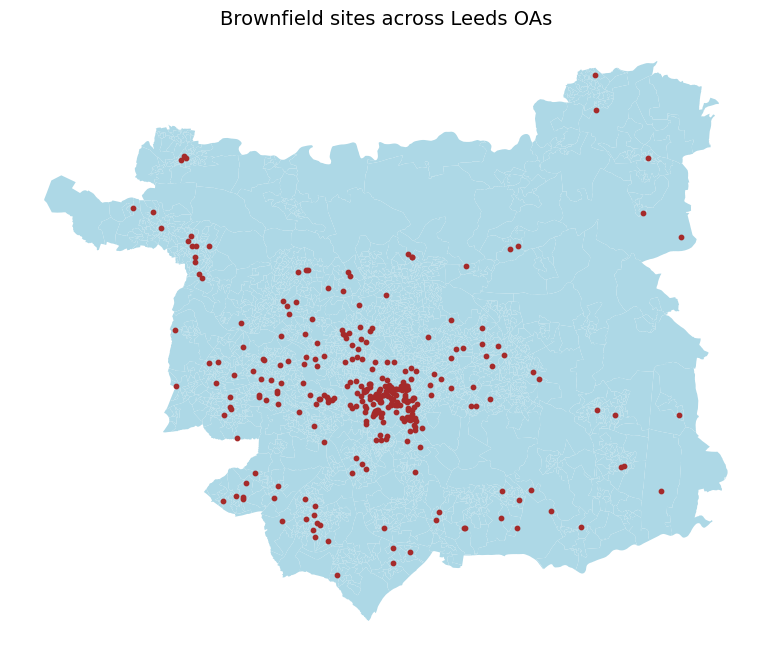

In [41]:
# create figure with 1 subplot
f, ax = plt.subplots (1, figsize = (16,8))

# plot brownfield sites aross Leeds LSOAs
leeds_oa.plot(ax=ax,color = "lightblue")
bfs_27700.plot(ax=ax, color = "brown", markersize =10)
# set title and adjust font size
ax.set_title('Brownfield sites across Leeds OAs', fontsize = 14)
# remove axis
ax.set_axis_off()
# add north arrow and arrange placement
#add_north_arrow(ax=ax, scale=.75, xlim_pos=0.1, ylim_pos=.85, color='#000', text_scaler=2, text_yT=-1.25)

plt.show();